In [1]:
library(ggplot2)
library(dplyr)
library(reshape2)

Warning message:
"package 'ggplot2' was built under R version 3.5.3"Warning message:
"package 'dplyr' was built under R version 3.5.3"
Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



In [2]:
# load the data
austin_bike_trip <- read.csv("austin_bike_share.csv")

In [3]:
head(austin_bike_trip)

bikeid,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,...,TempHighF,TempAvgF,DewPointHighF,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events
8,19:12:00,41,2565,Trinity & 6th Street,3,2536,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,...,83,73,66,64,100,79,12,5,0,
141,2:06:04,6,2570,South Congress & Academy,10,2494,2nd & Congress,2016-10-30 02:06:04,Local365,...,87,76,67,63,100,67,10,2,0,
578,16:28:27,13,2498,Convention Center / 4th St. @ MetroRail,3,2538,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,...,71,65,63,61,100,87,9,3,0.36,"Rain , Thunderstorm"
555,15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),...,81,67,57,48,100,62,16,5,0,
86,15:39:13,25,3377,MoPac Pedestrian Bridge @ Veterans Drive,4,2707,Rainey St @ Cummings,2017-04-16 15:39:13,Walk Up,...,84,77,68,66,90,73,14,6,0,
861,15:12:00,29,2537,West & 6th St.,5,2540,17th & Guadalupe,2015-05-29 15:12:00,Local30,...,89,77,73,66,100,76,21,5,0.67,"Rain , Thunderstorm"


In [4]:
# get rid of bike id
austin_bike_trip <- austin_bike_trip[, -1]

In [5]:
str(austin_bike_trip)

'data.frame':	520872 obs. of  27 variables:
 $ checkout_time          : Factor w/ 63989 levels "0:02:01","0:02:14",..: 36274 39263 26509 21937 23565 21937 11895 14747 12085 41266 ...
 $ duration_minutes       : int  41 6 13 80 25 29 17 19 20 44 ...
 $ end_station_id         : int  2565 2570 2498 2712 3377 2537 2575 2571 3377 2565 ...
 $ end_station_name       : Factor w/ 70 levels "11th & San Jacinto",..: 65 56 26 64 41 68 54 50 41 65 ...
 $ month                  : int  3 10 3 11 4 5 7 5 7 3 ...
 $ start_station_id       : int  2536 2494 2538 2497 2707 2540 2567 2503 2575 2563 ...
 $ start_station_name     : Factor w/ 72 levels "11th & San Jacinto",..: 69 4 20 22 50 3 45 60 55 27 ...
 $ start_time             : Factor w/ 307149 levels "2013-12-21 09:12:00",..: 8587 190022 82572 6489 257133 10025 143667 2420 298738 1372 ...
 $ subscriber_type        : Factor w/ 50 levels "","24-Hour-Online (Austin B-cycle)",..: 48 36 36 3 48 34 48 3 48 3 ...
 $ trip_id                : num  9.90e+09 1.

In [6]:
# get rid of the year 2013 and 2017
bike_share <- austin_bike_trip %>% filter(year != 2013, year != 2017)

In [14]:
write.csv(bike_share, "austin_bike_share_2014-2016.csv")

In [29]:
k <- read.csv("austin_bike_share_2014-2016.csv")

In [32]:
k <- read.csv("austin_bike_share.csv")

In [36]:
length(unique(k$trip_id))

[1] 520872

In [37]:
str(k$id)

 int [1:520872] 258428 516644 468569 288534 102010 81230 138452 453746 557397 90643 ...


In [23]:
g <- k %>% group_by(Date) %>% tally()

In [25]:
g <- g %>% arrange(g$n)

In [26]:
g

Date,n
2015-01-10,10
2014-01-28,16
2014-02-02,17
2014-01-08,20
2014-01-06,21
2015-01-01,21
2014-01-23,25
2014-01-24,26
2014-02-11,31
2015-02-28,32


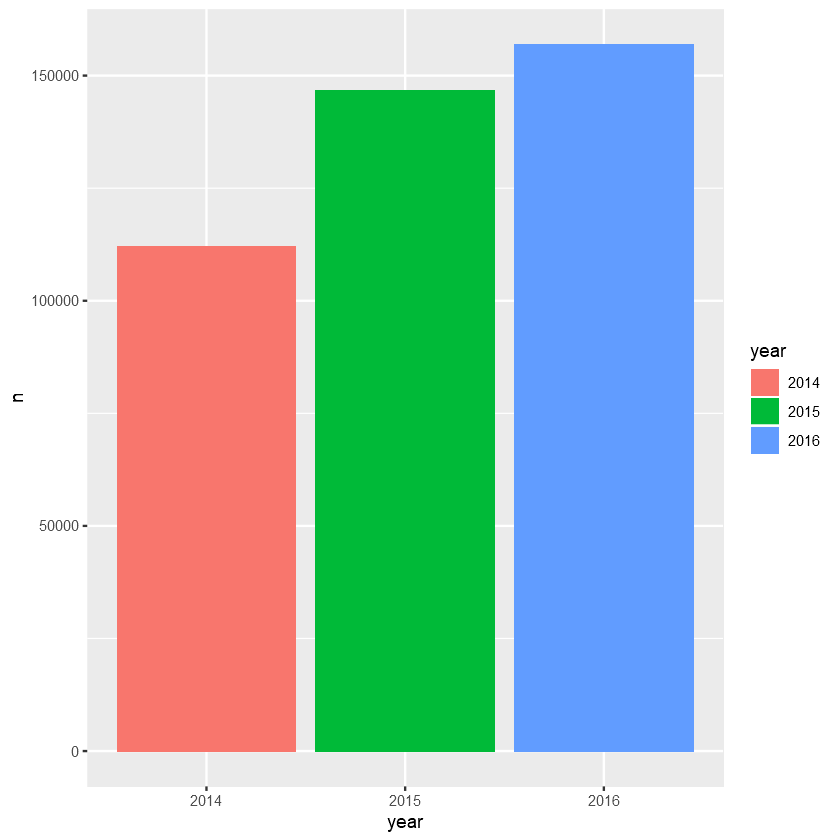

In [8]:
# number of ridge between year 
number_ridge <- bike_share %>% group_by(year) %>% tally()
number_ridge$year <- as.factor(number_ridge$year)
ggplot(number_ridge, aes(x=year, y=n, fill=year)) + geom_bar(stat = "identity")

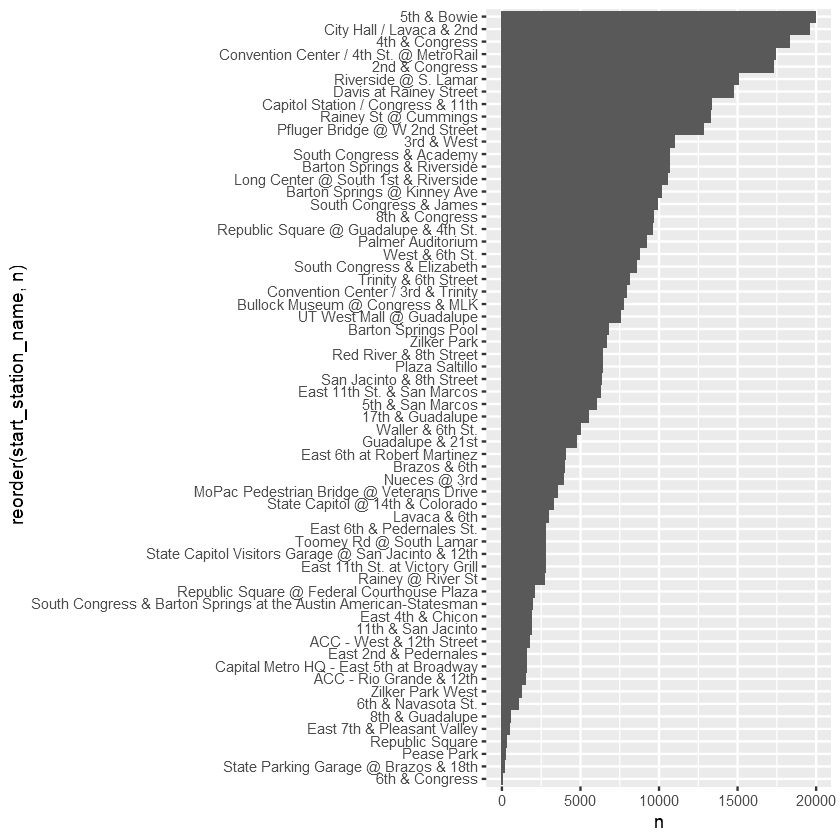

In [9]:
# we wanna see the where the most busy start station and most busy stop station. 
k <- bike_share %>% group_by(start_station_name) %>% tally()
ggplot(data = k, aes(x = reorder(start_station_name, n), y = n)) + 
    geom_bar(position = "dodge", stat="identity") + coord_flip()

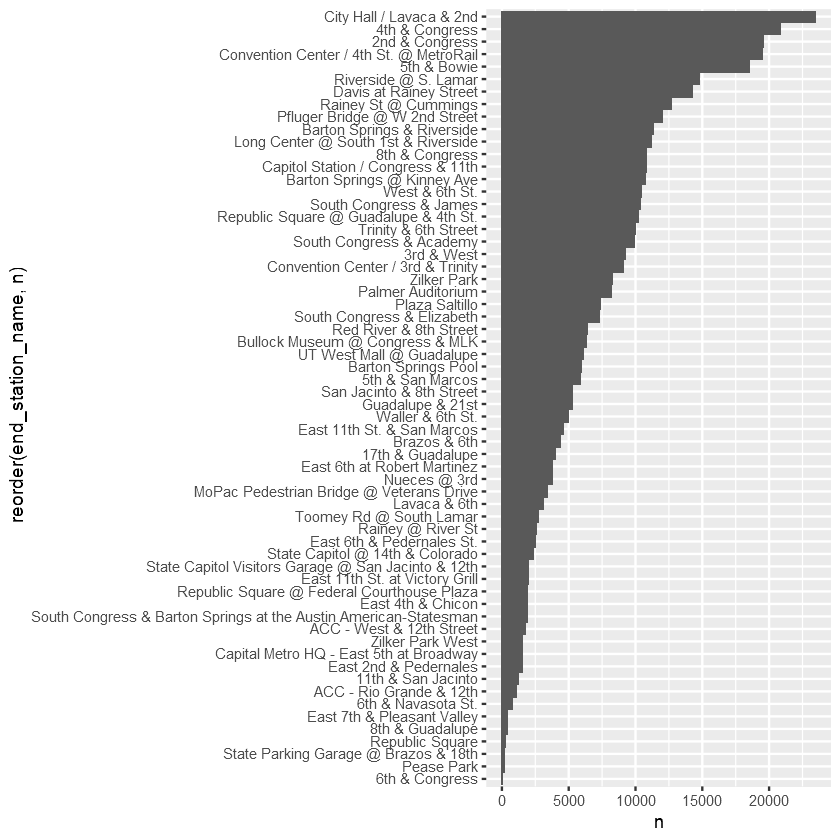

In [10]:
# we wanna see the where the most busy start station and most busy stop station. 
k <- bike_share %>% group_by(end_station_name) %>% tally()
ggplot(data = k, aes(x = reorder(end_station_name, n), y = n)) + 
    geom_bar(position = "dodge", stat="identity") + coord_flip()

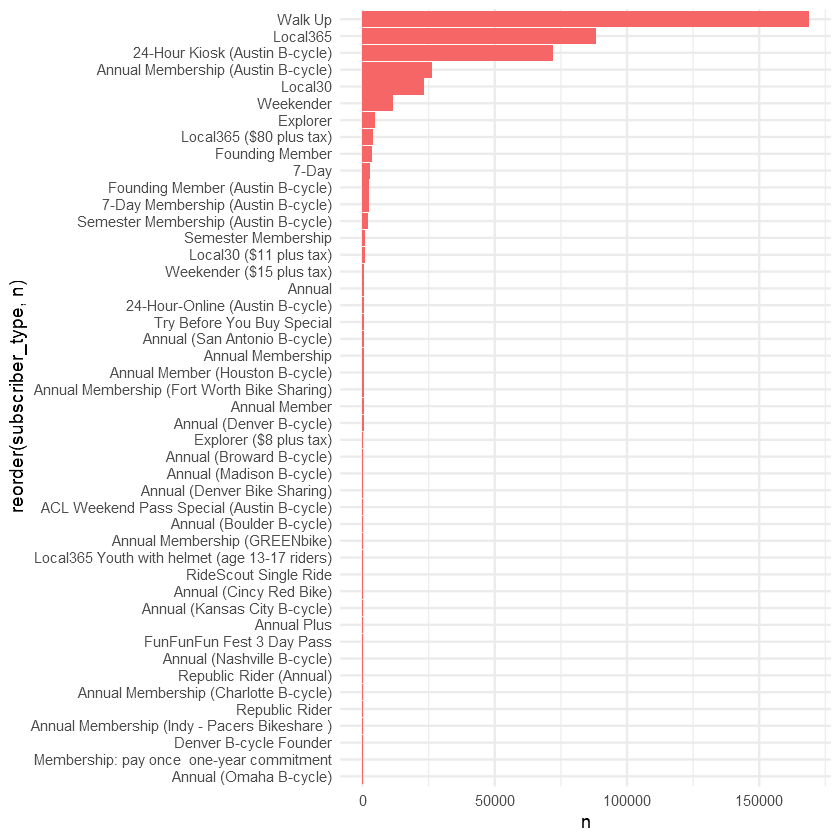

In [11]:
# I wanna see the type of subscriber
subscriber <- bike_share %>% group_by(subscriber_type) %>% tally()
ggplot(subscriber, aes(x = reorder(subscriber_type,n), y = n)) +
        geom_bar(position = "dodge", stat = "identity", fill="#F66666") +
        coord_flip() + theme_minimal()

In [12]:
# now, I wanna see the busiest day and the calmest day
busiest_calmest <- bike_share %>% group_by(Date) %>% tally()
str(busiest_calmest)
busiest_calmest[order(-busiest_calmest$n),]

Classes 'tbl_df', 'tbl' and 'data.frame':	1034 obs. of  2 variables:
 $ Date: Factor w/ 1257 levels "2013-12-21","2013-12-22",..: 12 13 14 15 16 17 18 19 20 21 ...
 $ n   : int  177 108 50 124 36 21 37 20 54 64 ...


Date,n
2015-03-19,2413
2014-03-14,2249
2015-03-14,2108
2015-03-15,2074
2014-03-15,2064
2016-03-17,2032
2015-03-18,1983
2015-03-16,1943
2016-10-08,1886
2015-10-10,1880


The busiest day is 19/03/2019 with 2413 ridge.

The calmest day is 10/01/2015 with only 10 ridgre

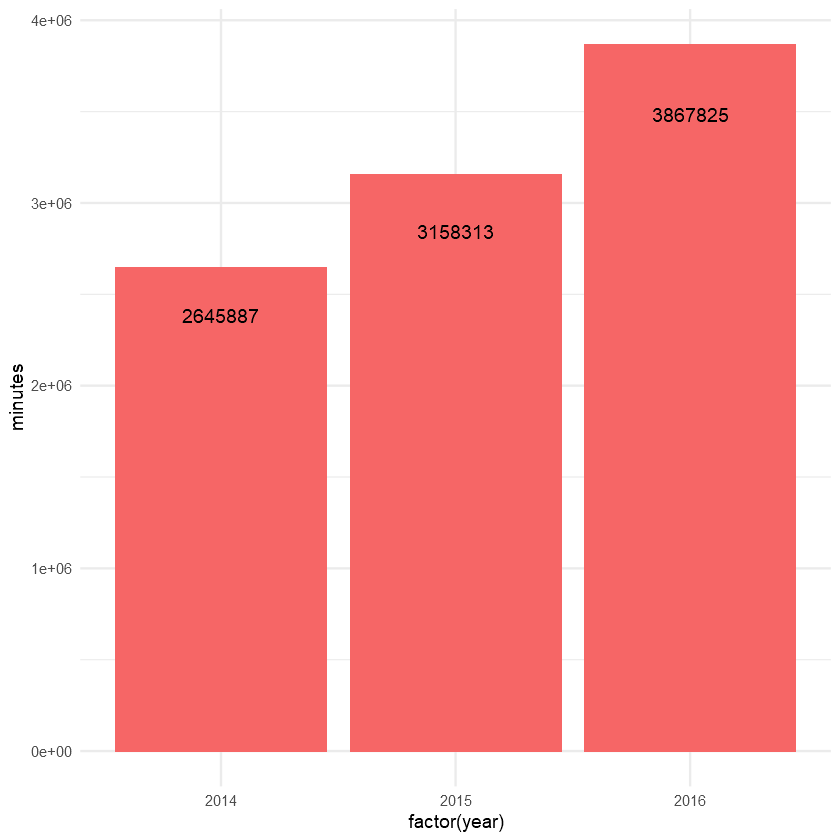

In [13]:
# I wanna see the total minutes of using bikeshare
total_minutes_using <- bike_share %>% group_by(year) %>% summarize(minutes = sum(duration_minutes))
ggplot(total_minutes_using, aes(x = factor(year), y = minutes)) + geom_bar(stat = "identity", fill="#F66666") +
    geom_text(aes(label = minutes), position=position_stack(0.9)) +
    theme_minimal()

In [15]:
# I wanna see the number of ride between weekday and weekend.
# add another column to see if the day is weekdays or weekend
fill_down_days_f <- function(x){
    date <- x[[8]]
    print(date)
    day <- weekdays(as.POSIXct(date), abbreviate = T)
    day
}
bike_share$day = 0
nrow(bike_share)

[1] 415600

In [21]:
bike_share_1 <- bike_share[1:100000,]
bike_share_1$day <- apply(bike_share_1, 1, fill_down_days_f)

[1] "2015-03-19 19:12:00"
[1] "2016-10-30 02:06:04"
[1] "2016-03-11 16:28:27"
[1] "2014-11-23 15:12:00"
[1] "2015-05-29 15:12:00"
[1] "2016-07-26 12:24:16"
[1] "2014-05-05 13:12:00"
[1] "2014-03-14 20:12:00"
[1] "2016-09-03 22:57:45"
[1] "2016-10-08 13:20:32"
[1] "2014-03-12 17:12:00"
[1] "2016-09-13 06:02:27"
[1] "2015-05-23 10:12:00"
[1] "2015-03-07 19:12:00"
[1] "2014-09-02 15:12:00"
[1] "2015-06-13 12:12:00"
[1] "2015-04-04 10:12:00"
[1] "2016-03-16 19:54:32"
[1] "2014-06-27 08:12:00"
[1] "2016-05-21 01:18:43"
[1] "2015-05-06 22:12:00"
[1] "2016-09-21 09:12:38"
[1] "2015-07-08 17:12:00"
[1] "2016-03-25 13:34:49"
[1] "2015-02-09 13:12:00"
[1] "2015-03-28 13:12:00"
[1] "2014-07-12 18:12:00"
[1] "2016-03-26 13:58:27"
[1] "2014-07-04 14:12:00"
[1] "2015-07-05 13:12:00"
[1] "2015-03-23 09:12:00"
[1] "2014-06-08 16:12:00"
[1] "2016-10-09 10:47:56"
[1] "2016-10-25 17:03:37"
[1] "2015-03-07 16:12:00"
[1] "2016-01-03 12:59:42"
[1] "2015-06-14 12:12:00"
[1] "2014-10-25 15:12:00"
[1] "2015-09

In [22]:
bike_share_2 <- bike_share[100001:200000,]
bike_share_2$day <- apply(bike_share_2, 1, fill_down_days_f)

[1] "2015-01-30 10:12:00"
[1] "2015-11-20 19:12:08"
[1] "2016-10-01 15:41:12"
[1] "2015-03-21 00:12:00"
[1] "2015-03-27 10:12:00"
[1] "2014-02-15 14:12:00"
[1] "2016-01-25 16:02:54"
[1] "2016-10-15 20:10:50"
[1] "2016-05-02 11:59:20"
[1] "2015-07-15 14:12:00"
[1] "2016-01-17 14:12:57"
[1] "2015-01-24 17:12:00"
[1] "2015-10-07 17:12:10"
[1] "2016-11-09 13:21:19"
[1] "2016-06-26 16:33:36"
[1] "2016-01-13 14:12:26"
[1] "2015-02-25 17:12:00"
[1] "2014-06-30 16:12:00"
[1] "2014-11-26 17:12:00"
[1] "2015-10-11 22:12:33"
[1] "2016-05-29 15:10:04"
[1] "2016-02-04 09:29:16"
[1] "2016-06-05 18:32:43"
[1] "2015-09-19 18:12:02"
[1] "2015-10-02 11:12:26"
[1] "2015-03-26 14:12:00"
[1] "2015-10-10 16:12:47"
[1] "2014-04-23 17:12:00"
[1] "2015-10-17 20:12:13"
[1] "2016-05-21 01:07:19"
[1] "2014-04-19 12:12:00"
[1] "2015-06-22 13:12:00"
[1] "2015-07-15 10:12:00"
[1] "2015-10-07 16:12:42"
[1] "2016-08-06 11:35:47"
[1] "2015-03-21 13:12:00"
[1] "2014-12-31 11:12:00"
[1] "2016-02-12 15:49:38"
[1] "2016-10

In [23]:
bike_share_3 <- bike_share[200001:300000,]
bike_share_3$day <- apply(bike_share_3, 1, fill_down_days_f)

[1] "2016-05-28 11:58:54"
[1] "2015-09-11 12:12:35"
[1] "2015-11-03 18:12:36"
[1] "2015-10-10 20:12:28"
[1] "2015-11-01 13:12:15"
[1] "2014-05-07 13:12:00"
[1] "2016-03-27 13:54:18"
[1] "2014-05-02 22:12:00"
[1] "2015-01-17 16:12:00"
[1] "2016-11-05 19:40:40"
[1] "2014-09-10 21:12:00"
[1] "2015-02-10 20:12:00"
[1] "2015-10-19 10:12:19"
[1] "2015-03-28 23:12:00"
[1] "2015-02-14 17:12:00"
[1] "2016-01-05 17:12:32"
[1] "2015-08-21 16:12:00"
[1] "2016-07-06 18:24:53"
[1] "2016-05-31 13:23:13"
[1] "2016-05-23 12:11:45"
[1] "2016-05-20 11:42:54"
[1] "2016-10-28 08:58:06"
[1] "2015-06-14 19:12:00"
[1] "2016-09-18 01:54:53"
[1] "2015-09-02 14:12:48"
[1] "2014-05-13 08:12:00"
[1] "2015-05-31 17:12:00"
[1] "2016-06-12 20:57:28"
[1] "2015-08-08 16:12:00"
[1] "2015-08-19 06:12:00"
[1] "2015-04-29 14:12:00"
[1] "2016-03-13 17:32:52"
[1] "2014-06-12 17:12:00"
[1] "2016-10-02 11:40:55"
[1] "2016-07-24 16:10:22"
[1] "2014-09-05 16:12:00"
[1] "2015-08-14 17:12:00"
[1] "2014-09-06 23:12:00"
[1] "2015-08

In [24]:
bike_share_4 <- bike_share[300001:400000,]
bike_share_4$day <- apply(bike_share_4, 1, fill_down_days_f)

[1] "2015-03-25 13:12:00"
[1] "2014-09-12 11:12:00"
[1] "2015-03-19 16:12:00"
[1] "2015-11-20 08:12:16"
[1] "2016-06-06 12:35:35"
[1] "2014-03-10 23:12:00"
[1] "2014-08-22 12:12:00"
[1] "2016-05-23 18:30:14"
[1] "2016-10-01 14:23:14"
[1] "2014-04-09 20:12:00"
[1] "2015-05-04 14:12:00"
[1] "2015-08-19 05:12:00"
[1] "2015-03-16 14:12:00"
[1] "2015-04-18 17:12:00"
[1] "2016-10-10 13:09:23"
[1] "2015-06-06 18:12:00"
[1] "2014-03-17 15:12:00"
[1] "2015-08-16 16:12:00"
[1] "2014-10-30 14:12:00"
[1] "2015-05-21 21:12:00"
[1] "2014-07-18 10:12:00"
[1] "2015-05-19 08:12:00"
[1] "2015-02-16 11:12:00"
[1] "2014-05-06 12:12:00"
[1] "2016-01-28 13:16:41"
[1] "2015-06-01 18:12:00"
[1] "2015-08-15 13:12:00"
[1] "2015-04-27 10:12:00"
[1] "2015-08-05 11:12:00"
[1] "2015-09-14 11:12:19"
[1] "2015-12-05 23:12:49"
[1] "2016-01-27 11:50:27"
[1] "2015-07-02 09:12:00"
[1] "2016-08-28 16:58:38"
[1] "2015-03-14 18:12:00"
[1] "2016-08-03 18:02:16"
[1] "2016-05-18 12:07:59"
[1] "2015-10-09 01:12:12"
[1] "2015-12

In [25]:
bike_share_5 <- bike_share[400001:415600,]
bike_share_5$day <- apply(bike_share_5, 1, fill_down_days_f)

[1] "2015-09-09 14:12:54"
[1] "2016-11-12 08:10:29"
[1] "2016-01-28 16:27:53"
[1] "2016-11-18 13:04:53"
[1] "2015-04-24 15:12:00"
[1] "2016-03-11 18:50:50"
[1] "2015-03-16 13:12:00"
[1] "2016-05-13 20:51:53"
[1] "2015-12-22 19:12:26"
[1] "2014-05-16 14:12:00"
[1] "2014-08-03 17:12:00"
[1] "2014-05-24 13:12:00"
[1] "2015-11-19 16:12:38"
[1] "2016-05-11 09:47:47"
[1] "2014-12-02 07:12:00"
[1] "2014-07-30 20:12:00"
[1] "2014-05-03 18:12:00"
[1] "2014-04-12 13:12:00"
[1] "2016-11-30 20:01:13"
[1] "2016-03-14 17:05:38"
[1] "2016-11-13 19:43:53"
[1] "2015-03-14 17:12:00"
[1] "2016-11-18 12:59:30"
[1] "2016-08-07 12:20:34"
[1] "2015-12-19 15:12:27"
[1] "2016-10-09 11:56:44"
[1] "2016-05-29 09:39:47"
[1] "2015-03-22 02:12:00"
[1] "2016-07-14 14:03:40"
[1] "2015-10-10 12:12:51"
[1] "2015-09-20 13:12:50"
[1] "2016-11-11 16:25:31"
[1] "2016-01-19 18:40:53"
[1] "2016-03-21 11:12:16"
[1] "2015-10-21 07:12:16"
[1] "2016-06-22 08:29:59"
[1] "2014-05-15 16:12:00"
[1] "2015-06-27 19:12:00"
[1] "2016-09

In [18]:
days <- apply(bike_share, 1, fill_down_days_f)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [26]:
r <- rbind(bike_share_1,bike_share_2, bike_share_3, bike_share_4, bike_share_5)

In [30]:
nrow(r)

[1] 415600

In [31]:
head(r)

checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,trip_id,...,TempAvgF,DewPointHighF,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day
19:12:00,41,2565,Trinity & 6th Street,3,2536,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,9900082882,...,73,66,64,100,79,12,5,0,,Thu
2:06:04,6,2570,South Congress & Academy,10,2494,2nd & Congress,2016-10-30 02:06:04,Local365,12617682,...,76,67,63,100,67,10,2,0,,Sun
16:28:27,13,2498,Convention Center / 4th St. @ MetroRail,3,2538,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,9075366,...,65,63,61,100,87,9,3,0.36,"Rain , Thunderstorm",Fri
15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),9900319298,...,67,57,48,100,62,16,5,0,,Sun
15:12:00,29,2537,West & 6th St.,5,2540,17th & Guadalupe,2015-05-29 15:12:00,Local30,9900153369,...,77,73,66,100,76,21,5,0.67,"Rain , Thunderstorm",Fri
12:24:16,17,2575,Riverside @ S. Lamar,7,2567,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,11114967,...,84,77,75,100,76,9,2,0.08,"Rain , Thunderstorm",Tue


In [32]:
write.csv(r, "austin_bike_share_with_day.csv")

In [33]:
# now, I wanna see the average in weekend and average using in weekdays
# group the data by days.
austin_bike_by_days <- r %>% group_by(day) %>% tally()

In [34]:
austin_bike_by_days

day,n
Fri,67113
Mon,49936
Sat,88011
Sun,70104
Thu,49800
Tue,44687
Wed,45949


In [52]:
weekdays <- austin_bike_by_days %>% filter(day != "Sat", day != "Sun")
weekends <- austin_bike_by_days %>% filter(day == "Sat" | day == "Sun")

In [53]:
weekdays
# average( we have three year, therefore devide for 156 ( 52*3)) 
sum(weekdays$n) / 156

day,n
Fri,67113
Mon,49936
Thu,49800
Tue,44687
Wed,45949


[1] 1650.545

In [55]:
weekends
# average (we have 3 year,  therefore devide for 156 ( 52*3))
sum(weekends$n) / 156

day,n
Sat,88011
Sun,70104


[1] 1013.558

In [172]:
nrow(r)

[1] 415600

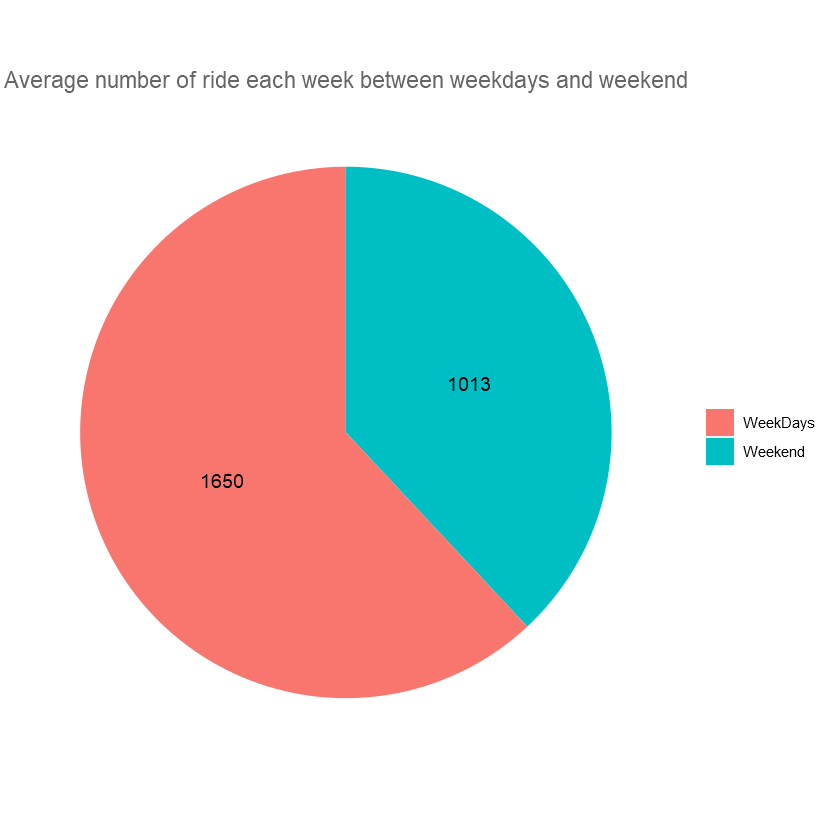

In [28]:
d <- data.frame("index"=c(1:2),"w"=0, "n"=0)
d[d$index==1, "w"] <- "WeekDays"
d[d$index==1, "n"] <- 1650
d[d$index==2, "w"] <- "Weekend"
d[d$index==2, "n"] <- 1013
ggplot(d, aes(x="", y= n, fill=w)) + geom_bar(stat="identity", width=1) + coord_polar("y", start=0) + 
    geom_text(aes(label = n), position = position_stack(vjust = 0.5)) + 
    labs(x = NULL, y = NULL, fill = NULL, title = "Average number of ride each week between weekdays and weekend") +
    theme_classic() + theme(axis.line = element_blank(),axis.text = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, color = "#666666"))

In [59]:
months <- r$month
r$month_abb <- month.abb[months]


In [60]:
head(r)

checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,trip_id,...,DewPointHighF,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day,month_abb
19:12:00,41,2565,Trinity & 6th Street,3,2536,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,9900082882,...,66,64,100,79,12,5,0,,Thu,Mar
2:06:04,6,2570,South Congress & Academy,10,2494,2nd & Congress,2016-10-30 02:06:04,Local365,12617682,...,67,63,100,67,10,2,0,,Sun,Oct
16:28:27,13,2498,Convention Center / 4th St. @ MetroRail,3,2538,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,9075366,...,63,61,100,87,9,3,0.36,"Rain , Thunderstorm",Fri,Mar
15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),9900319298,...,57,48,100,62,16,5,0,,Sun,Nov
15:12:00,29,2537,West & 6th St.,5,2540,17th & Guadalupe,2015-05-29 15:12:00,Local30,9900153369,...,73,66,100,76,21,5,0.67,"Rain , Thunderstorm",Fri,May
12:24:16,17,2575,Riverside @ S. Lamar,7,2567,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,11114967,...,77,75,100,76,9,2,0.08,"Rain , Thunderstorm",Tue,Jul


In [95]:
time_series <- r %>% select(year, month, month_abb, Date) %>% 
                group_by(year, month_abb, Date) %>% tally() %>%
                arrange(year, Date)

In [98]:
head(time_series)

year,month_abb,Date,n
2014,Jan,2014-01-01,177
2014,Jan,2014-01-02,108
2014,Jan,2014-01-03,50
2014,Jan,2014-01-04,124
2014,Jan,2014-01-05,36
2014,Jan,2014-01-06,21


In [97]:
# time series
library(forecast)
library(fpp2)

Warning message:
"package 'fpp2' was built under R version 3.5.3"Loading required package: fma
Warning message:
"package 'fma' was built under R version 3.5.3"Loading required package: expsmooth
Warning message:
"package 'expsmooth' was built under R version 3.5.3"

In [110]:
pass.ts <- ts(time_series[time_series$year == 2014,]["n"], start=c(2014, 1), frequency = 365)

Warning message:
"Ignoring unknown parameters: facets"

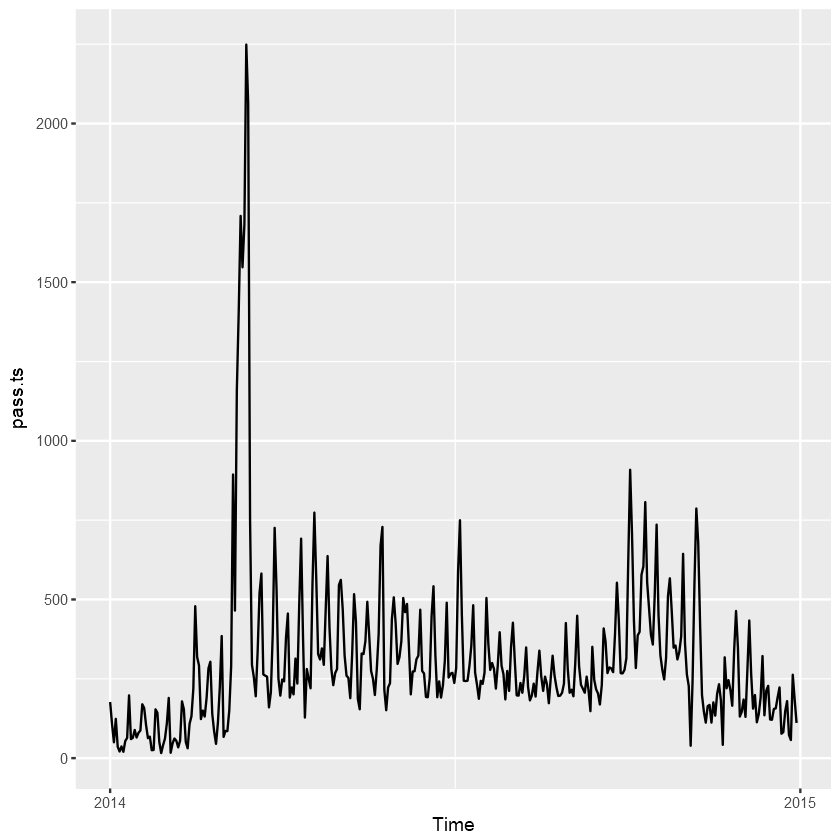

In [111]:
autoplot(pass.ts, facets = TRUE)

In [134]:
library(dygraphs)
# library(xts) # To make the convertion data-frame / xts format
library(lubridate) # You will love it to work with dates
library(tidyverse)

In [156]:
time_series$year <- as.factor(time_series$year)
time_series$Date <- as.Date(time_series$Date)
time_series

year,month_abb,Date,n
2014,Jan,2014-01-01,177
2014,Jan,2014-01-02,108
2014,Jan,2014-01-03,50
2014,Jan,2014-01-04,124
2014,Jan,2014-01-05,36
2014,Jan,2014-01-06,21
2014,Jan,2014-01-07,37
2014,Jan,2014-01-08,20
2014,Jan,2014-01-09,54
2014,Jan,2014-01-10,64


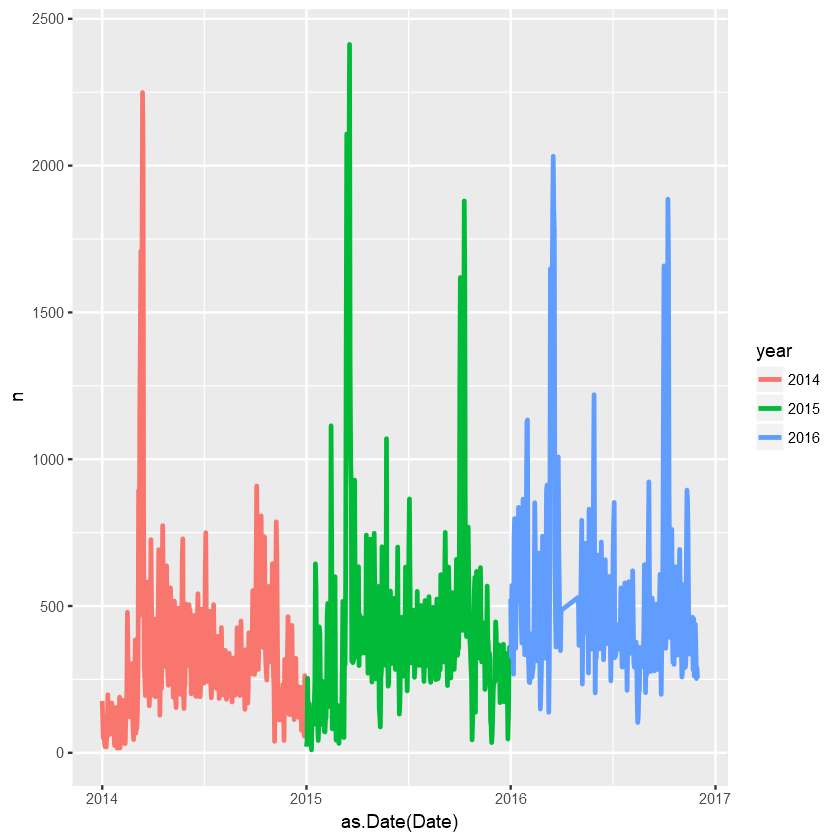

In [171]:
# ggplot(time_series, aes(x=as.Date(Date), y = n)) + geom_line()
ggplot(time_series,aes(x=as.Date(Date), y = n)) +
        geom_line(aes(color=year), size=1)
#         geom_line(time_series[time_series$year==2015,], aes(x=as.Date(Date), y = n))

In [178]:
# get the number of start station and number of end station into one dataframe
start_station <- r %>% group_by(start_station_name) %>% tally()
names(start_station) = c("station_name","s_value")

In [179]:
end_station <- r %>% group_by(end_station_name) %>% tally()
names(end_station) <- c("station_name","e_value")

In [181]:
head(start_station)
head(end_station)

station_name,s_value
11th & San Jacinto,1877
17th & Guadalupe,5506
2nd & Congress,17309
3rd & West,10975
4th & Congress,18292
5th & Bowie,19942


station_name,e_value
11th & San Jacinto,1233
17th & Guadalupe,3999
2nd & Congress,19610
3rd & West,9229
4th & Congress,20836
5th & Bowie,18548


In [184]:
nrow(start_station)
nrow(end_station)
# now, merger all of them
start_end_station <- left_join(start_station, end_station , by = "station_name")

[1] 62

[1] 62

Warning message:
"Column `station_name` joining factors with different levels, coercing to character vector"

In [188]:
write.csv(start_end_station, "start_end_station.csv")

In [190]:
# see the data with average duration 
austin_bike_share_minutes <- r %>% group_by(day) %>% summarize(duration = sum(duration_minutes)) 

In [192]:
avg_hours_per_weekdays <- austin_bike_share_minutes %>% filter(day != "Sat", day !="Sun")
avg_hours_per_weekend <- austin_bike_share_minutes %>% filter(day == "Sat" | day =="Sun")
austin_bike_share_minutes

day,duration
Fri,1616236
Mon,1023653
Sat,2512872
Sun,1886027
Thu,977666
Tue,810303
Wed,845268


In [200]:
sum(avg_hours_per_weekdays$duration) / 156
sum(avg_hours_per_weekend$duration) / 156

[1] 33802.09

[1] 28198.07

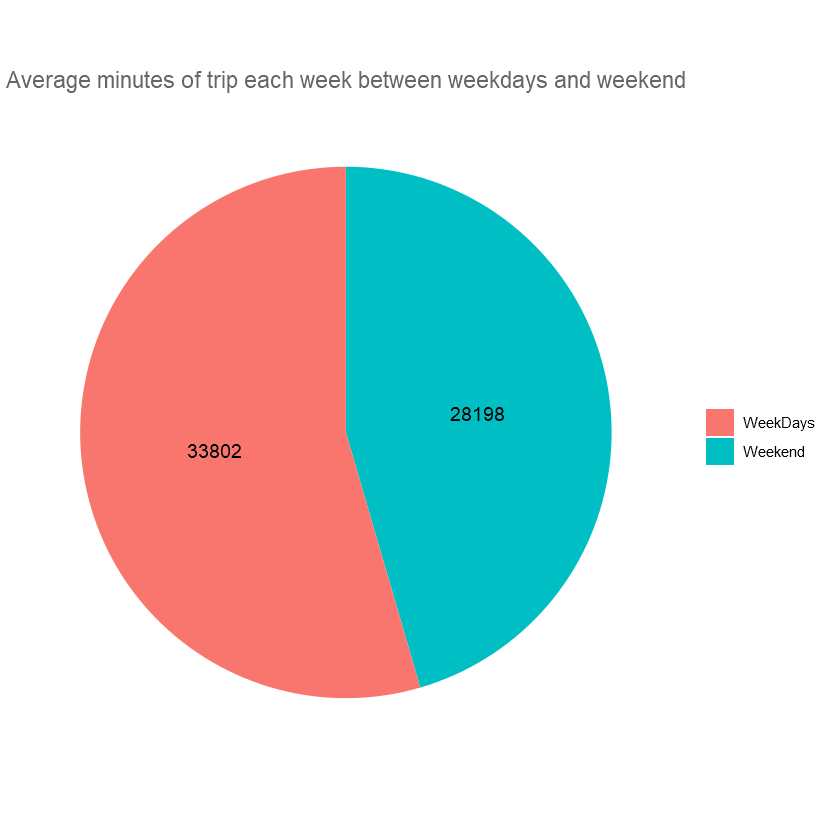

In [27]:
d <- data.frame("index"=c(1:2),"w"=0, "n"=0)
d[d$index==1, "w"] <- "WeekDays"
d[d$index==1, "n"] <- 33802
d[d$index==2, "w"] <- "Weekend"
d[d$index==2, "n"] <- 28198
ggplot(d, aes(x="", y= n, fill=w)) + geom_bar(stat="identity", width=1) + coord_polar("y", start=0) + 
    geom_text(aes(label = n), position = position_stack(vjust = 0.5)) + 
    labs(x = NULL, y = NULL, fill = NULL, title = "Average minutes of trip each week between weekdays and weekend") +
    theme_classic() + theme(axis.line = element_blank(),axis.text = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, color = "#666666"))

In [69]:
walk_up <- "Walk Up"
hour_kiosk_24 <- "24-Hour Kiosk (Austin B-cycle)"
local365 <- "Local365"
# first_subscribers <- r %>% filter(subscriber_type == walk_up | subscriber_type == hour_kiosk_24 | subscriber_type == local365)
# nrow(first_subscribers)

In [264]:
second_subscribers <- r %>% filter(subscriber_type != walk_up , subscriber_type != hour_kiosk_24 , subscriber_type != local365)
nrow(second_subcribers)

[1] 87033

In [265]:
total_first_subscriber <- first_subcribers %>% group_by(subscriber_type) %>% tally()
total_first_subscriber

total_second_subscriber <- second_subscribers %>% group_by(subscriber_type) %>% tally()
total_second_subscriber <- sum(total_second_subscriber$n)
total_second_subscriber

subscriber_type,n
24-Hour Kiosk (Austin B-cycle),71966
Local365,87954
Walk Up,168647


[1] 87033

In [270]:
# total_first_subscriber[nrow(total_first_subscriber)+1,] <- list(subscriber_type=as.factor("Other Subscriber"),n=87033)
total_second_subscriber <- data.frame("subscriber_type"=0,"n"=0)
total_second_subscriber[1,"subscriber_type"] <- "Other"
total_second_subscriber[1,"n"] <- 87033

In [271]:
total_second_subscriber

subscriber_type,n
Other,87033


In [273]:
final_subcribers <- rbind(total_first_subscriber, total_second_subscriber)

In [274]:
final_subcribers

subscriber_type,n
24-Hour Kiosk (Austin B-cycle),71966
Local365,87954
Walk Up,168647
Other,87033


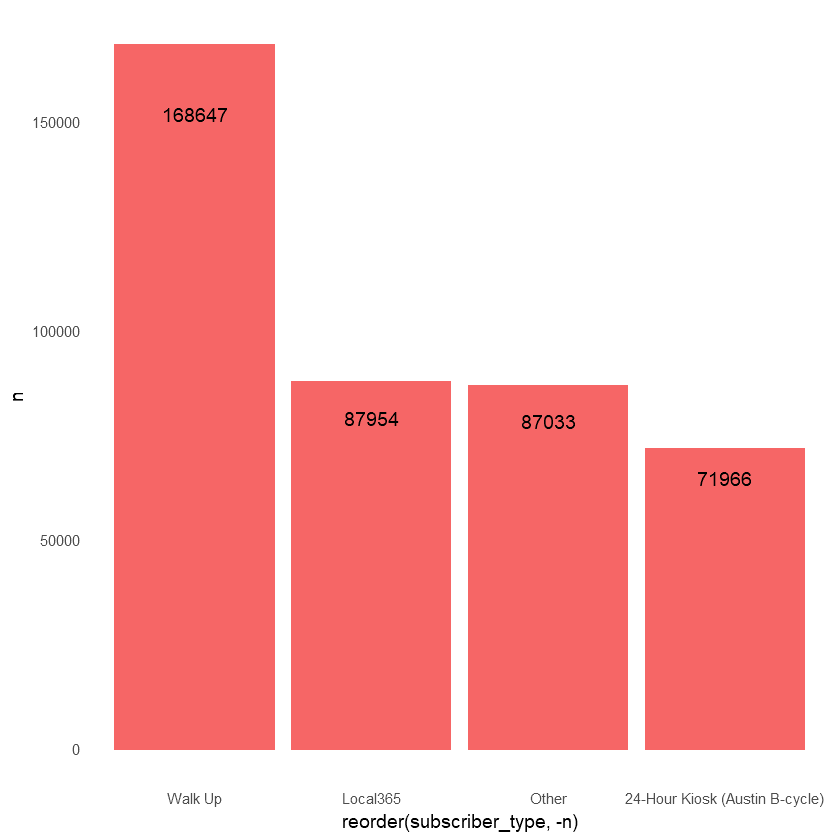

In [290]:
ggplot(final_subcribers, aes(x=reorder(subscriber_type,-n), y= n)) + geom_bar(stat = "identity", fill="#F66666") + 
    geom_text(aes(label = n), position=position_stack(0.9)) + 
    theme_classic() + theme(axis.line = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, color = "#666666"))

In [ ]:
new_r <- read.csv("austin_bike_share_with_day.csv")[,-1]

In [6]:
# change all the subscribers except 24 hours, walkup and local 365 to the
new_r$subscriber_type <- as.character(new_r$subscriber_type)

In [9]:
new_r[new_r$subscriber_type != walk_up & new_r$subscriber_type != hour_kiosk_24 & new_r$subscriber_type != local365, 
      "subscriber_type"] <- "Other"

In [10]:
head(new_r)

checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,trip_id,...,TempAvgF,DewPointHighF,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day
19:12:00,41,2565,Trinity & 6th Street,3,2536,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,9900082882,...,73,66,64,100,79,12,5,0,,Thu
2:06:04,6,2570,South Congress & Academy,10,2494,2nd & Congress,2016-10-30 02:06:04,Local365,12617682,...,76,67,63,100,67,10,2,0,,Sun
16:28:27,13,2498,Convention Center / 4th St. @ MetroRail,3,2538,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,9075366,...,65,63,61,100,87,9,3,0.36,"Rain , Thunderstorm",Fri
15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),9900319298,...,67,57,48,100,62,16,5,0,,Sun
15:12:00,29,2537,West & 6th St.,5,2540,17th & Guadalupe,2015-05-29 15:12:00,Other,9900153369,...,77,73,66,100,76,21,5,0.67,"Rain , Thunderstorm",Fri
12:24:16,17,2575,Riverside @ S. Lamar,7,2567,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,11114967,...,84,77,75,100,76,9,2,0.08,"Rain , Thunderstorm",Tue


In [11]:
nrow(new_r[new_r$subscriber_type == "Other",])

[1] 87033

In [371]:
# now I wanna see the hours the bike is used per hours.
group_r <- new_r %>% group_by(subscriber_type, day) %>% tally()

In [32]:
new_r$checkout_time <- as.character(new_r$checkout_time)

In [28]:
new_r$checkout_time <- as.factor(new_r$checkout_time)

In [35]:
library(lubridate)

extract_hours_f <- function(x){
    checkout_time <- x[[1]]
    checkout_time <- hms(checkout_time)
    hours <- hour(checkout_time)
    hours
}
new_r$hour <- apply(new_r, 1, extract_hours_f)

In [37]:
write.csv(new_r, "austin_bike_share_with_hour.csv")

In [38]:
head(new_r)

checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,trip_id,...,DewPointHighF,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day,hour
19:12:00,41,2565,Trinity & 6th Street,3,2536,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,9900082882,...,66,64,100,79,12,5,0,,Thu,19
2:06:04,6,2570,South Congress & Academy,10,2494,2nd & Congress,2016-10-30 02:06:04,Local365,12617682,...,67,63,100,67,10,2,0,,Sun,2
16:28:27,13,2498,Convention Center / 4th St. @ MetroRail,3,2538,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,9075366,...,63,61,100,87,9,3,0.36,"Rain , Thunderstorm",Fri,16
15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),9900319298,...,57,48,100,62,16,5,0,,Sun,15
15:12:00,29,2537,West & 6th St.,5,2540,17th & Guadalupe,2015-05-29 15:12:00,Other,9900153369,...,73,66,100,76,21,5,0.67,"Rain , Thunderstorm",Fri,15
12:24:16,17,2575,Riverside @ S. Lamar,7,2567,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,11114967,...,77,75,100,76,9,2,0.08,"Rain , Thunderstorm",Tue,12


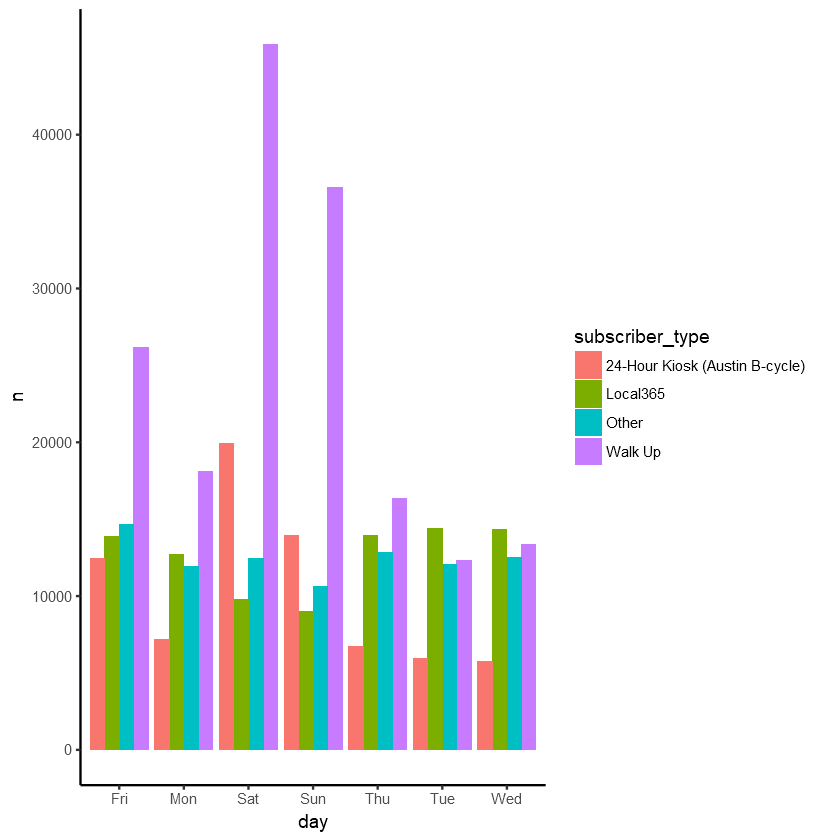

In [375]:
ggplot(group_r, aes(x=day, y = n , fill=subscriber_type)) + geom_bar(stat = "identity", position = "dodge") + theme_classic()

In [79]:
# now, visualize by duration. 
# let make a discrete for column duration 
duration <- new_r$duration_minutes

In [80]:
duration <- cut(duration, breaks=c(-Inf,5,10,15,20,25,30,35,40,45,50,55,60,Inf), 
           labels=c("0-5","5-10","10-15","15-20","20-25","25-30","30-35","35-40","40-45","45-50","50-55","55-60",">60"))

In [81]:
new_r$duration_discrete <- duration

In [82]:
head(new_r)

checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,trip_id,...,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day,hour,duration_discrete
19:12:00,41,2565,Trinity & 6th Street,3,2536,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,9900082882,...,64,100,79,12,5,0,,Thu,19,40-45
2:06:04,6,2570,South Congress & Academy,10,2494,2nd & Congress,2016-10-30 02:06:04,Local365,12617682,...,63,100,67,10,2,0,,Sun,2,5-10
16:28:27,13,2498,Convention Center / 4th St. @ MetroRail,3,2538,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,9075366,...,61,100,87,9,3,0.36,"Rain , Thunderstorm",Fri,16,10-15
15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),9900319298,...,48,100,62,16,5,0,,Sun,15,>60
15:12:00,29,2537,West & 6th St.,5,2540,17th & Guadalupe,2015-05-29 15:12:00,Other,9900153369,...,66,100,76,21,5,0.67,"Rain , Thunderstorm",Fri,15,25-30
12:24:16,17,2575,Riverside @ S. Lamar,7,2567,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,11114967,...,75,100,76,9,2,0.08,"Rain , Thunderstorm",Tue,12,15-20


In [83]:
group_hours <- new_r %>% group_by(subscriber_type,duration_discrete) %>% tally()
# ggplot(new_r, aes(x=duration_dicrete))


In [84]:
k <- new_r %>% select(subscriber_type, duration_discrete)
write.csv(k,"group_by_subscriber_hour.csv")

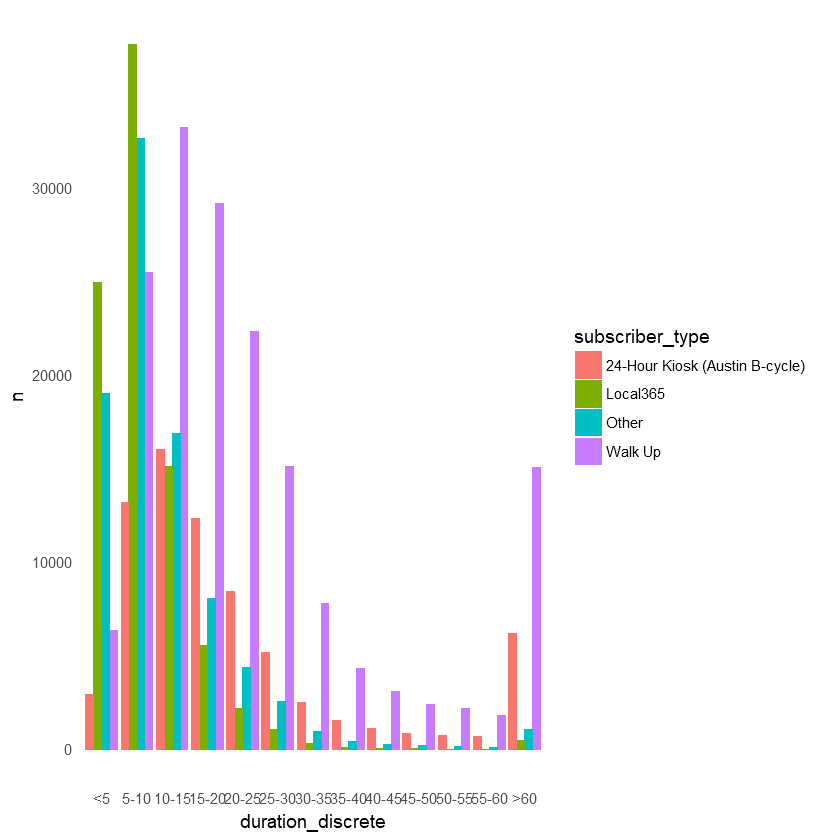

In [73]:
ggplot(group_hours, aes(x=duration_discrete, y = n, fill=subscriber_type)) + geom_bar(stat = "identity", position = "dodge") +
    theme_classic() + theme(axis.line = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, color = "#666666"))

In [59]:
nrow(new_r[new_r$duration_minutes > 60,])

[1] 22907

,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,trip_id,...,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day,hour,duration_discrete
4,15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),9900319298,...,48,100,62,16,5,0,,Sun,15,>60
17,10:12:00,218,2494,2nd & Congress,4,2569,East 11th St. & San Marcos,2015-04-04 10:12:00,Walk Up,9900109433,...,44,61,53,17,8,0,,Sat,10,>60
27,18:12:00,62,2549,Long Center @ South 1st & Riverside,7,2503,South Congress & James,2014-07-12 18:12:00,24-Hour Kiosk (Austin B-cycle),9900189087,...,66,93,59,13,4,0,,Sat,18,>60
87,2:12:00,431,2562,San Jacinto & 8th Street,3,2495,4th & Congress,2015-03-21 02:12:00,Other,9900085418,...,56,100,95,10,4,0.43,Rain,Sat,2,>60
88,12:20:21,62,2707,Rainey St @ Cummings,6,2563,Davis at Rainey Street,2016-06-11 12:20:21,Walk Up,10420519,...,74,88,72,12,6,0,,Sat,12,>60
154,13:12:00,81,2549,Long Center @ South 1st & Riverside,5,2499,City Hall / Lavaca & 2nd,2015-05-16 13:12:00,Walk Up,9900146257,...,70,97,79,18,9,0,,Sat,13,>60
165,16:12:00,67,2494,2nd & Congress,12,2497,Capitol Station / Congress & 11th,2014-12-07 16:12:00,Walk Up,9900337320,...,48,89,83,9,4,0,,Sun,16,>60
166,12:52:12,79,2566,Pfluger Bridge @ W 2nd Street,5,2494,2nd & Congress,2016-05-01 12:52:12,Walk Up,9796303,...,60,87,69,13,7,T,,Sun,12,>60
180,16:12:00,85,2503,South Congress & James,4,2575,Riverside @ S. Lamar,2014-04-04 16:12:00,24-Hour Kiosk (Austin B-cycle),9900094393,...,35,93,58,17,8,T,Rain,Fri,16,>60
185,11:12:00,79,2575,Riverside @ S. Lamar,3,2565,Trinity & 6th Street,2014-03-22 11:12:00,24-Hour Kiosk (Austin B-cycle),9900058181,...,62,100,80,12,4,0,,Sat,11,>60


In [35]:
data <- read.csv("austin_bike_share_with_hour.csv")

In [36]:
head(data)

X,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,...,DewPointHighF,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day,hour
1,19:12:00,41,2565,Trinity & 6th Street,3,2536,Waller & 6th St.,2015-03-19 19:12:00,Walk Up,...,66,64,100,79,12,5,0,,Thu,19
2,2:06:04,6,2570,South Congress & Academy,10,2494,2nd & Congress,2016-10-30 02:06:04,Local365,...,67,63,100,67,10,2,0,,Sun,2
3,16:28:27,13,2498,Convention Center / 4th St. @ MetroRail,3,2538,Bullock Museum @ Congress & MLK,2016-03-11 16:28:27,Local365,...,63,61,100,87,9,3,0.36,"Rain , Thunderstorm",Fri,16
4,15:12:00,80,2712,Toomey Rd @ South Lamar,11,2497,Capitol Station / Congress & 11th,2014-11-23 15:12:00,24-Hour Kiosk (Austin B-cycle),...,57,48,100,62,16,5,0,,Sun,15
5,15:12:00,29,2537,West & 6th St.,5,2540,17th & Guadalupe,2015-05-29 15:12:00,Other,...,73,66,100,76,21,5,0.67,"Rain , Thunderstorm",Fri,15
6,12:24:16,17,2575,Riverside @ S. Lamar,7,2567,Palmer Auditorium,2016-07-26 12:24:16,Walk Up,...,77,75,100,76,9,2,0.08,"Rain , Thunderstorm",Tue,12


In [37]:
data$Events <- as.character(data$Events)

In [43]:
unique(data$Events)

[1] "Unknow"                    "Rain , Thunderstorm"      
[3] "Rain"                      "Fog , Rain , Thunderstorm"
[5] "Thunderstorm"              "Fog , Rain"               
[7] "Fog"                       "Fog , Thunderstorm"       
[9] "Rain , Snow"

In [42]:
data[data$Events==' ', 'Events'] <- as.character("Unknow")

In [6]:
data_weather <- data %>% filter(Events != ' ')

In [32]:
data[data$Events==' ', 'Events'] <- "Unknow"

In [33]:
unique(data_weather$Events)

[1] "Rain , Thunderstorm"       "Rain"                     
[3] "Fog , Rain , Thunderstorm" "Thunderstorm"             
[5] "Fog , Rain"                "Fog"                      
[7] "Fog , Thunderstorm"        "Rain , Snow"

In [44]:
data_weather_group <- data %>% group_by(Date, Events) %>% tally()

In [45]:
data_weather_group

Date,Events,n
2014-01-01,Unknow,177
2014-01-02,Unknow,108
2014-01-03,Unknow,50
2014-01-04,Unknow,124
2014-01-05,Unknow,36
2014-01-06,Unknow,21
2014-01-07,Unknow,37
2014-01-08,Rain,20
2014-01-09,Fog,54
2014-01-10,Rain,64


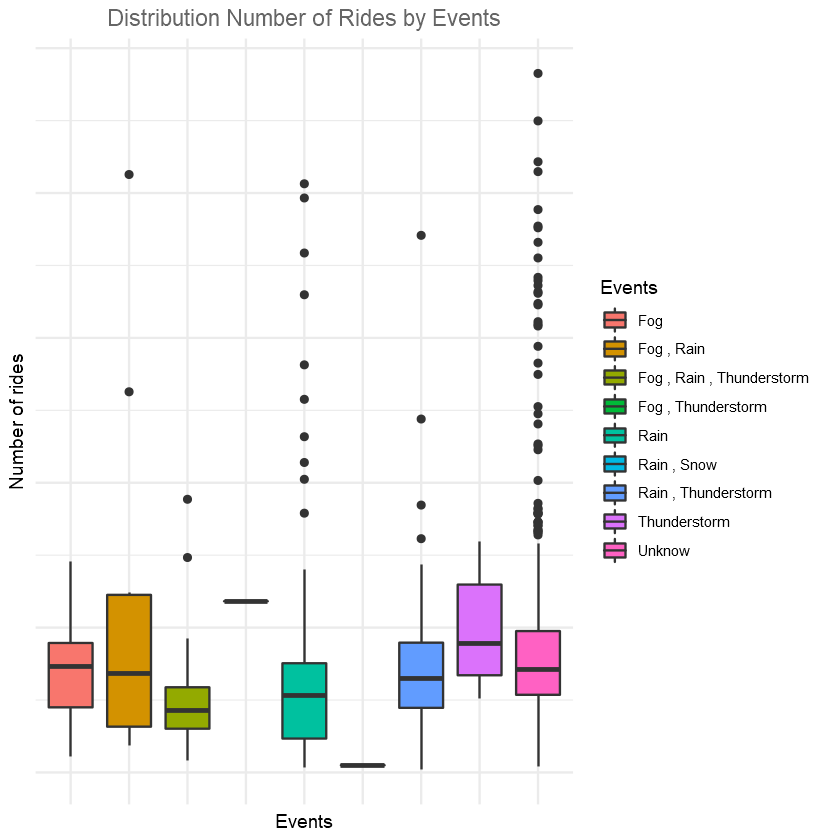

In [58]:
ggplot(data_weather_group, aes(x=Events, y=n, fill=Events)) + geom_boxplot() + theme_classic() + theme_minimal() + theme(axis.line = element_blank(),axis.text = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, color = "#666666")) +
          ggtitle("Distribution Number of Rides by Events") + ylab("Number of rides")

In [49]:
data$TempAvgF <- as.numeric(data$TempAvgF)

In [50]:
temavg <- data$TempAvgF

In [51]:
temavg <- cut(temavg, breaks=c(20,40,50,65,70,80,85,92), 
           labels=c("20-40","40-50","50-60","60-70","70-80","80-85","85-92"))

In [52]:
data$TempAvgCategory <- temavg

In [53]:
g <- data %>% group_by(Date, TempAvgCategory) %>% tally()

In [54]:
min(data$TempAvgF)

[1] 29

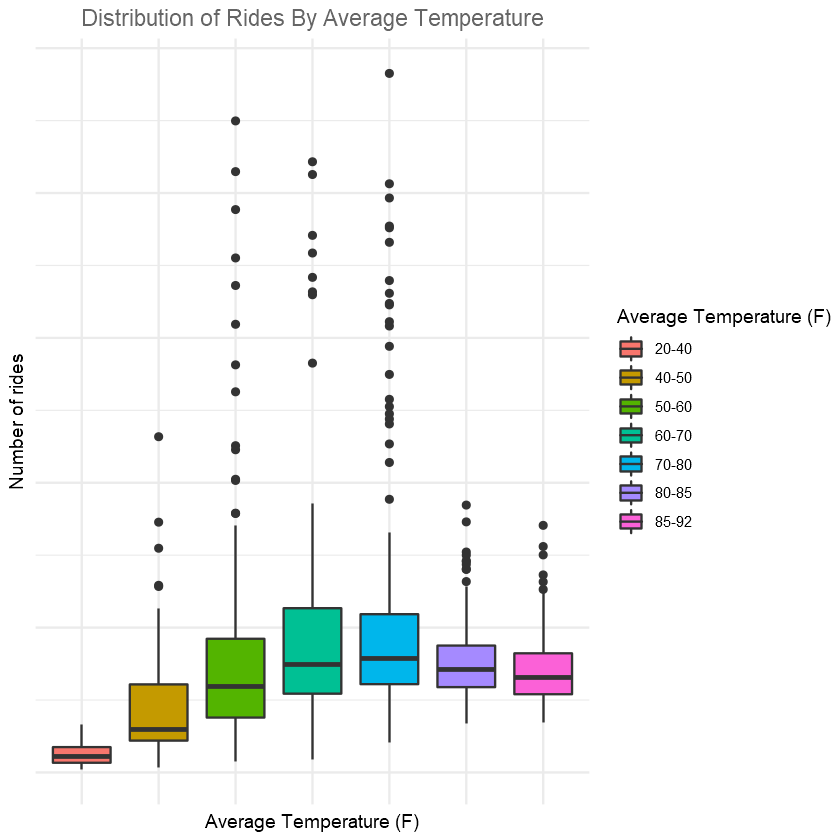

In [59]:
ggplot(g, aes(x=TempAvgCategory, y=n, fill=TempAvgCategory)) + geom_boxplot() + theme_classic() + theme_minimal() + theme(axis.line = element_blank(),axis.text = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, color = "#666666"))+
          ggtitle("Distribution of Rides By Average Temperature") + 
          xlab("Average Temperature (F)") + labs(fill="Average Temperature (F)") + ylab("Number of rides")

`geom_smooth()` using method = 'loess' and formula 'y ~ x'


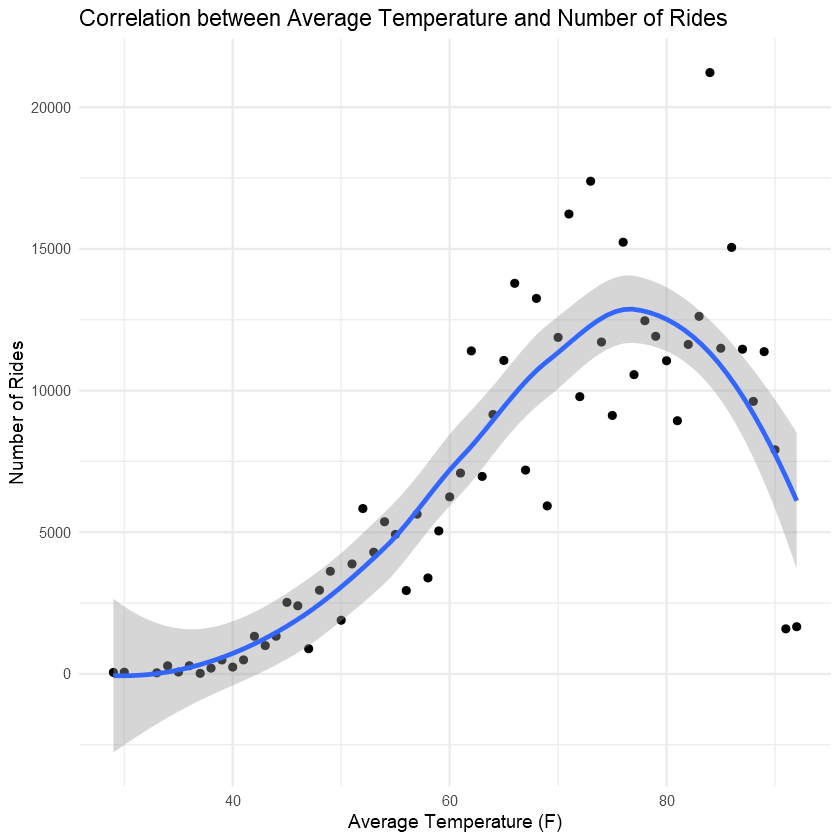

In [60]:
# if the temperature increase, does number of ridge increase
h <- data %>% group_by(TempAvgF) %>% tally()
ggplot(h, aes(x=TempAvgF, y=n)) + geom_point() + geom_smooth() + theme_minimal() + 
ggtitle("Correlation between Average Temperature and Number of Rides") +
xlab("Average Temperature (F)") + 
ylab("Number of Rides")

In [83]:
data[data$subscriber_type== hour_kiosk_24 & data$year == 2017,]

Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"Warning message in cbind(parts$left, ellip_h, parts$right, deparse.level = 0L):
"number of rows of result is not a multiple of vector length (arg 2)"

X,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,...,DewPointAvgF,HumidityHighPercent,HumidityAvgPercent,WindHighMPH,WindAvgMPH,PrecipitationSumInches,Events,day,hour,TempAvgCategory


In [78]:
head(data$year)


[1] 2015 2016 2016 2014 2015 2016

In [84]:
k <- read.csv("austin-bike/austin_bikeshare_trips.csv")

In [90]:
hour_kiosk_24
k[k$year == 2016 & k$subscriber_type == hour_kiosk_24,]

[1] "24-Hour Kiosk (Austin B-cycle)"

bikeid,checkout_time,duration_minutes,end_station_id,end_station_name,month,start_station_id,start_station_name,start_time,subscriber_type,trip_id,year


In [1]:
data <- read.csv("austin_bike_share_with_hour.csv")

In [2]:
data$Events <- as.character(data$Events)
data[data$Events == ' ', 'Events'] <- "Unknow"

In [14]:
library(ggplot2)
library(dplyr)
library(reshape2)

In [15]:
g <- data %>% group_by(Date, Events) %>% tally()

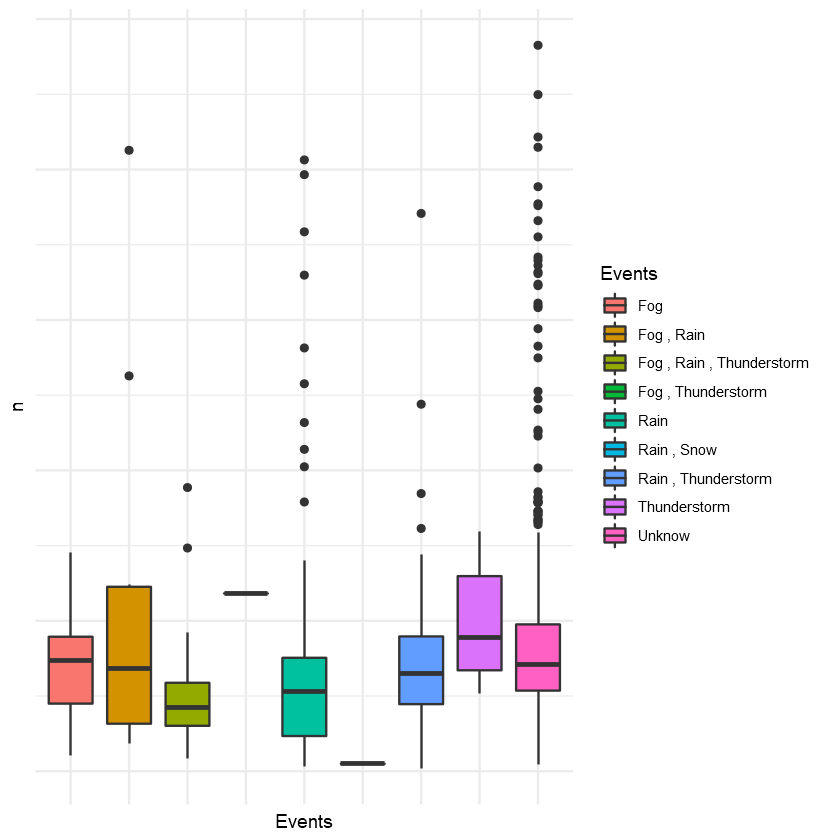

In [16]:
ggplot(g, aes(x=Events, y=n, fill=Events)) + geom_boxplot() + theme_classic() + theme_minimal() + theme(axis.line = element_blank(),axis.text = element_blank(),
          axis.ticks = element_blank(),
          plot.title = element_text(hjust = 0.5, color = "#666666"))

In [62]:
duration <- data$duration_minutes
duration <- cut(duration, breaks=c(-Inf,5,10,15,20,25,30,35,40,45,50,55,60,Inf), 
           labels=c("0-5","5-10","10-15","15-20","20-25","25-30","30-35","35-40","40-45","45-50","50-55","55-60",">60"))

In [63]:
data_new <- data

In [64]:
data_new$duration <- duration

In [65]:
temavg <- data_new$TempAvgF
temavg <- cut(temavg, breaks=c(20,40,50,65,70,80,85,92), 
           labels=c("20-40","40-50","50-60","60-70","70-80","80-85","85-92"))

In [66]:
data_new$TempAvg <- temavg

In [67]:
data_new <- data_new[, -1]

In [68]:
g <- data_new %>% group_by(duration, Events) %>% tally()

In [83]:
names(g) <- c("Duration", "Events", "Rides")

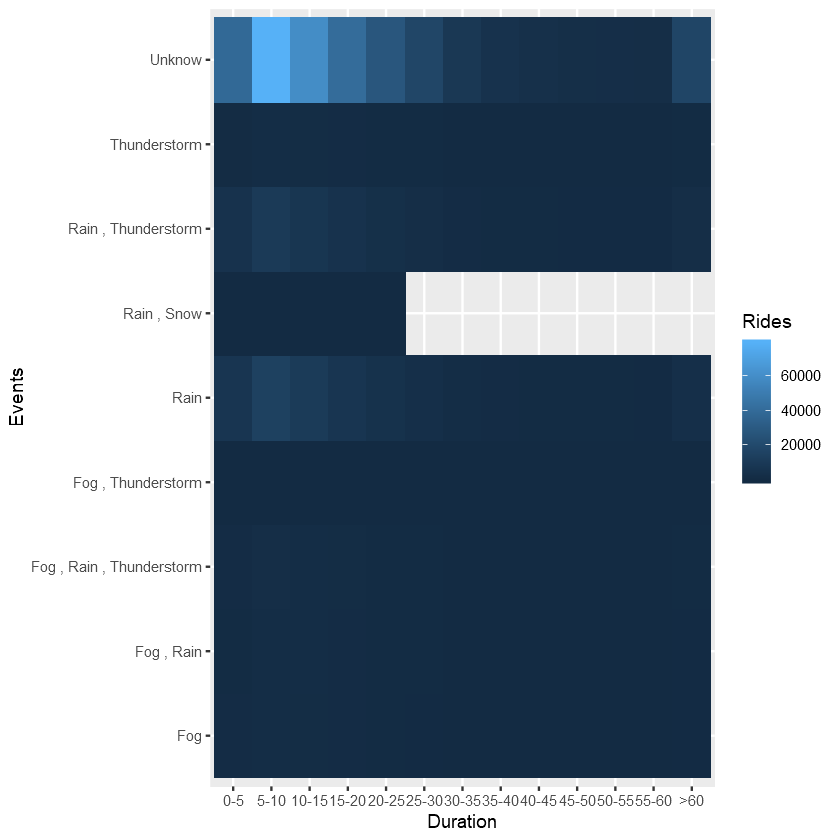

In [86]:
ggplot(g, aes(x=Duration, y= Events, fill=Rides)) + geom_tile() +
    scale_colour_gradientn(colours=terrain.colors(10))

In [108]:
ggg <- ggplot(g, aes(x=Duration, y= Events, fill=Rides)) + geom_raster(aes(fill=Rides)) +
    scale_fill_gradientn(colours= terrain.colors(10)) + 
    ggtitle("Number of Ride over Weather Conditions") +
    labs(fill="Number of Rides") + theme_classic() + coord_fixed(1.5)
ggsave("Number of Ride over Weather Conditions.jpg",ggg, width = 16, height = 9, dpi=120)

In [109]:
str(data)

'data.frame':	415600 obs. of  31 variables:
 $ X                      : int  1 2 3 4 5 6 7 8 9 10 ...
 $ checkout_time          : Factor w/ 56343 levels "0:02:01","0:02:14",..: 33880 36556 24421 19978 19978 10228 12983 38174 45282 13489 ...
 $ duration_minutes       : int  41 6 13 80 29 17 19 44 12 21 ...
 $ end_station_id         : int  2565 2570 2498 2712 2537 2575 2571 2565 2537 1006 ...
 $ end_station_name       : Factor w/ 62 levels "11th & San Jacinto",..: 57 49 23 56 60 47 43 57 60 62 ...
 $ month                  : int  3 10 3 11 5 7 5 3 9 10 ...
 $ start_station_id       : int  2536 2494 2538 2497 2540 2567 2503 2563 2565 2565 ...
 $ start_station_name     : Factor w/ 62 levels "11th & San Jacinto",..: 59 3 18 20 2 37 52 24 57 57 ...
 $ start_time             : Factor w/ 203488 levels "2014-01-01 00:12:00",..: 8434 189869 82419 6336 9872 143514 2267 1219 157708 176764 ...
 $ subscriber_type        : Factor w/ 4 levels "24-Hour Kiosk (Austin B-cycle)",..: 4 2 2 1 3 4 1 1 4 4 ..

In [110]:
gg <- data %>% group_by(day, hour) %>% tally()

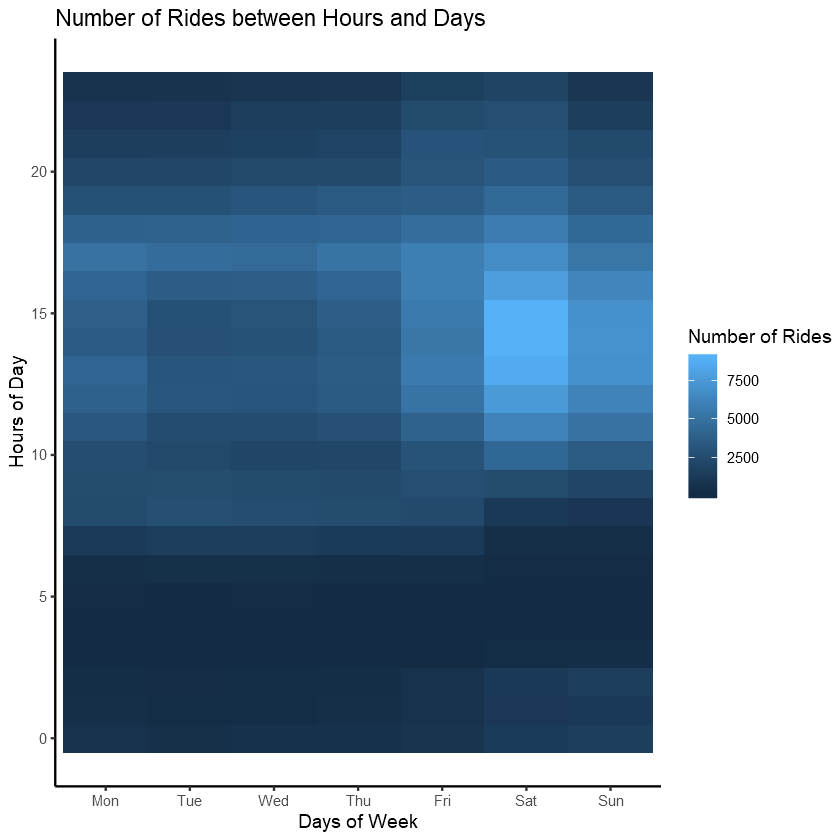

In [117]:
ggplot(gg, aes(x=factor(gg$day, levels = c("Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun")), 
               y= hour, fill=n)) + geom_tile() + xlab("Days of Week") + ylab("Hours of Day") + labs(fill="Number of Rides") +
               ggtitle("Number of Rides between Hours and Days") + theme_classic()

In [47]:
gg <- data %>% group_by(subscriber_type, day, hour) %>% tally()

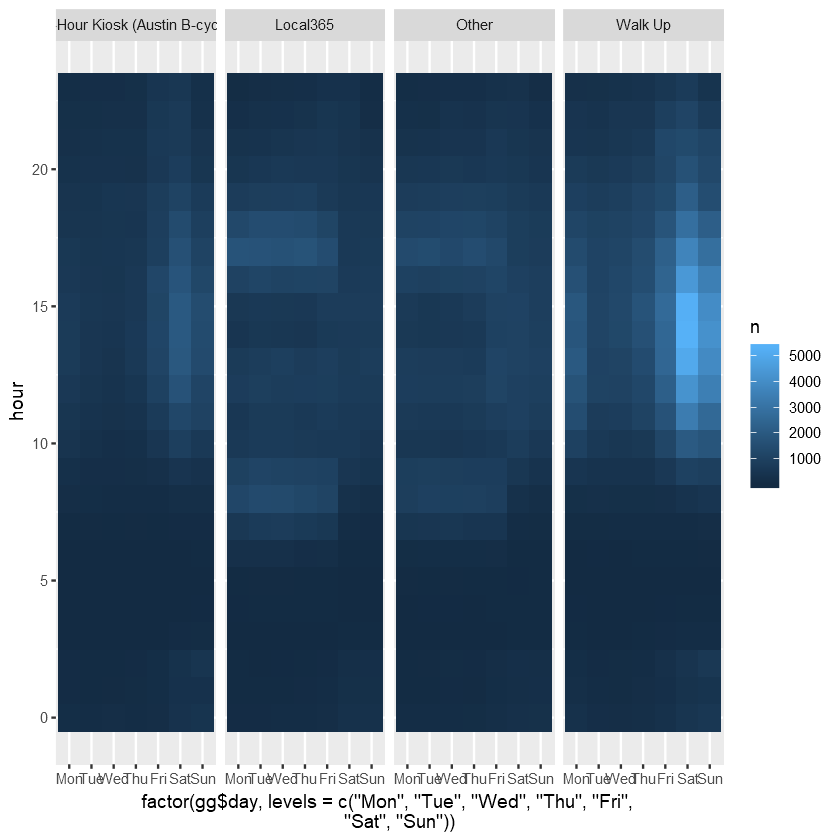

In [48]:
ggplot(gg, aes(x=factor(gg$day, levels = c("Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun")), 
               y= hour, fill=n)) + geom_tile() + facet_grid(~subscriber_type) 

In [50]:
library(maptools)
library(plyr)

In [14]:
gg <- data %>% group_by(start_station_name, end_station_name) %>% tally()

In [15]:
g <- data %>% group_by(start_station_name,start_station_longitude, start_station_latitude,
                      end_station_name, end_station_longitude, end_station_latitude) %>% tally()

In [68]:
write.csv(g, "traffic.csv")

In [18]:
xquiet<- scale_x_continuous("", breaks=NULL)
yquiet<-scale_y_continuous("", breaks=NULL)
quiet<-list(xquiet, yquiet)

In [21]:
g <- g %>% arrange(-n)

In [23]:
g <- g[1:10,]

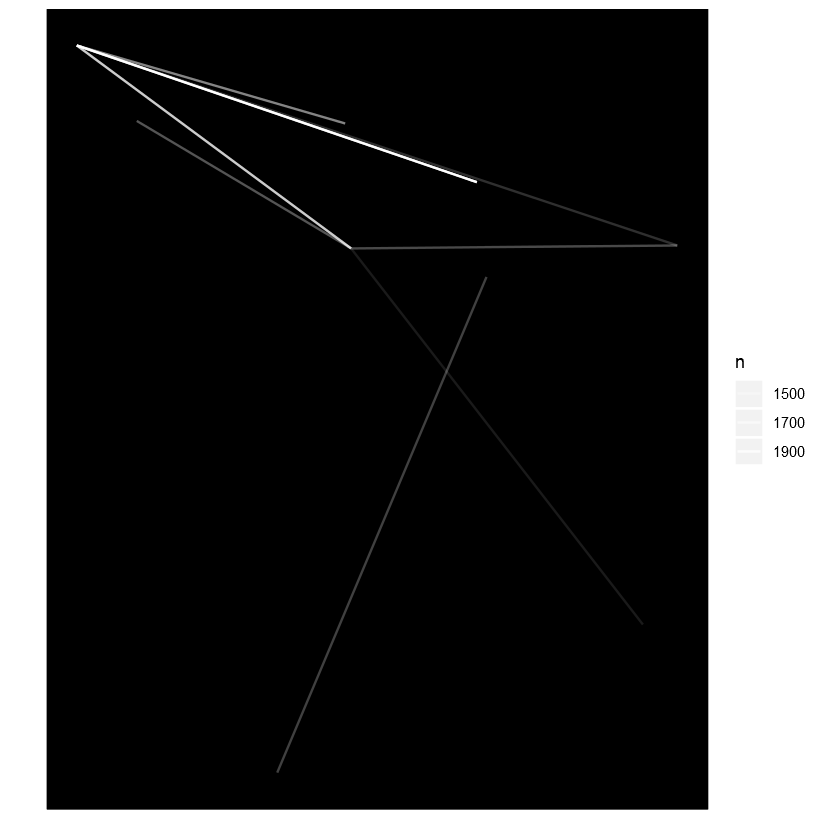

In [26]:
ggplot(g, aes(x=start_station_longitude, y= start_station_latitude)) + 
    geom_segment(aes(x=start_station_longitude, y = start_station_latitude, xend=end_station_longitude, 
                    yend=end_station_latitude, alpha=n), col="white") +
    theme(panel.background = element_rect(fill='black',colour='black'))+quiet+coord_equal()

In [124]:
k <- data %>% group_by(start_station_name, end_station_name) %>% tally()
k <- k %>% arrange(-n)
names(k) <- c("Starting Station Name","Ending Station Name", "Number of Rides")
k

Starting Station Name,Ending Station Name,Number of Rides
5th & Bowie,4th & Congress,2079
4th & Congress,5th & Bowie,1896
5th & Bowie,City Hall / Lavaca & 2nd,1835
Republic Square @ Guadalupe & 4th St.,5th & Bowie,1664
3rd & West,City Hall / Lavaca & 2nd,1503
City Hall / Lavaca & 2nd,5th & Bowie,1471
Convention Center / 4th St. @ MetroRail,City Hall / Lavaca & 2nd,1466
South Congress & Academy,2nd & Congress,1434
5th & Bowie,Convention Center / 4th St. @ MetroRail,1377
Rainey St @ Cummings,City Hall / Lavaca & 2nd,1306


In [120]:
library(dplyr)

In [4]:
data <- read.csv("austin_bike_share_with_hour.csv")

In [5]:
str(data)

'data.frame':	415600 obs. of  30 variables:
 $ X                      : int  1 2 3 4 5 6 7 8 9 10 ...
 $ checkout_time          : Factor w/ 56343 levels "0:02:01","0:02:14",..: 33880 36556 24421 19978 19978 10228 12983 38174 45282 13489 ...
 $ duration_minutes       : int  41 6 13 80 29 17 19 44 12 21 ...
 $ end_station_id         : int  2565 2570 2498 2712 2537 2575 2571 2565 2537 1006 ...
 $ end_station_name       : Factor w/ 62 levels "11th & San Jacinto",..: 57 49 23 56 60 47 43 57 60 62 ...
 $ month                  : int  3 10 3 11 5 7 5 3 9 10 ...
 $ start_station_id       : int  2536 2494 2538 2497 2540 2567 2503 2563 2565 2565 ...
 $ start_station_name     : Factor w/ 62 levels "11th & San Jacinto",..: 59 3 18 20 2 37 52 24 57 57 ...
 $ start_time             : Factor w/ 203488 levels "2014-01-01 00:12:00",..: 8434 189869 82419 6336 9872 143514 2267 1219 157708 176764 ...
 $ subscriber_type        : Factor w/ 4 levels "24-Hour Kiosk (Austin B-cycle)",..: 4 2 2 1 3 4 1 1 4 4 ..

In [10]:
d <- data %>% group_by(start_station_name, start_station_latitude, start_station_longitude, end_station_name, end_station_latitude, end_station_longitude) %>% tally()

In [13]:
d %>% arrange(-n)

start_station_name,start_station_latitude,start_station_longitude,end_station_name,end_station_latitude,end_station_longitude,n
5th & Bowie,30.26960,-97.75332,4th & Congress,30.26634,-97.74378,2079
4th & Congress,30.26634,-97.74378,5th & Bowie,30.26960,-97.75332,1896
5th & Bowie,30.26960,-97.75332,City Hall / Lavaca & 2nd,30.26476,-97.74678,1835
Republic Square @ Guadalupe & 4th St.,30.26774,-97.74692,5th & Bowie,30.26960,-97.75332,1664
3rd & West,30.26780,-97.75189,City Hall / Lavaca & 2nd,30.26476,-97.74678,1503
City Hall / Lavaca & 2nd,30.26476,-97.74678,5th & Bowie,30.26960,-97.75332,1471
Convention Center / 4th St. @ MetroRail,30.26483,-97.73900,City Hall / Lavaca & 2nd,30.26476,-97.74678,1466
South Congress & Academy,30.25226,-97.74854,2nd & Congress,30.26408,-97.74355,1434
5th & Bowie,30.26960,-97.75332,Convention Center / 4th St. @ MetroRail,30.26483,-97.73900,1377
Rainey St @ Cummings,30.25579,-97.73982,City Hall / Lavaca & 2nd,30.26476,-97.74678,1306


In [2]:
day <- read.csv("austin_bike_share_with_day.csv")
hour <- read.csv("austin_bike_share_with_hour.csv")

In [3]:
str(day)

'data.frame':	415600 obs. of  29 variables:
 $ X                      : int  1 2 3 4 5 6 7 8 9 10 ...
 $ checkout_time          : Factor w/ 56343 levels "0:02:01","0:02:14",..: 33880 36556 24421 19978 19978 10228 12983 38174 45282 13489 ...
 $ duration_minutes       : int  41 6 13 80 29 17 19 44 12 21 ...
 $ end_station_id         : int  2565 2570 2498 2712 2537 2575 2571 2565 2537 1006 ...
 $ end_station_name       : Factor w/ 62 levels "11th & San Jacinto",..: 57 49 23 56 60 47 43 57 60 62 ...
 $ month                  : int  3 10 3 11 5 7 5 3 9 10 ...
 $ start_station_id       : int  2536 2494 2538 2497 2540 2567 2503 2563 2565 2565 ...
 $ start_station_name     : Factor w/ 62 levels "11th & San Jacinto",..: 59 3 18 20 2 37 52 24 57 57 ...
 $ start_time             : Factor w/ 203488 levels "2014-01-01 00:12:00",..: 8434 189869 82419 6336 9872 143514 2267 1219 157708 176764 ...
 $ subscriber_type        : Factor w/ 46 levels "24-Hour-Online (Austin B-cycle)",..: 44 34 34 2 32 44 2 2

In [5]:
unique(hour$subscriber_type)

[1] Walk Up                        Local365                      
[3] 24-Hour Kiosk (Austin B-cycle) Other                         
Levels: 24-Hour Kiosk (Austin B-cycle) Local365 Other Walk Up

In [6]:
hour$user_type <- day$subscriber_type

In [7]:
write.csv(hour, "austin_bike_share_with_hour_2.csv")

In [8]:
str(hour)

'data.frame':	415600 obs. of  31 variables:
 $ X                      : int  1 2 3 4 5 6 7 8 9 10 ...
 $ checkout_time          : Factor w/ 56343 levels "0:02:01","0:02:14",..: 33880 36556 24421 19978 19978 10228 12983 38174 45282 13489 ...
 $ duration_minutes       : int  41 6 13 80 29 17 19 44 12 21 ...
 $ end_station_id         : int  2565 2570 2498 2712 2537 2575 2571 2565 2537 1006 ...
 $ end_station_name       : Factor w/ 62 levels "11th & San Jacinto",..: 57 49 23 56 60 47 43 57 60 62 ...
 $ month                  : int  3 10 3 11 5 7 5 3 9 10 ...
 $ start_station_id       : int  2536 2494 2538 2497 2540 2567 2503 2563 2565 2565 ...
 $ start_station_name     : Factor w/ 62 levels "11th & San Jacinto",..: 59 3 18 20 2 37 52 24 57 57 ...
 $ start_time             : Factor w/ 203488 levels "2014-01-01 00:12:00",..: 8434 189869 82419 6336 9872 143514 2267 1219 157708 176764 ...
 $ subscriber_type        : Factor w/ 4 levels "24-Hour Kiosk (Austin B-cycle)",..: 4 2 2 1 3 4 1 1 4 4 ..

In [9]:
unique(hour$user_type)

[1] Walk Up                                      
 [2] Local365                                     
 [3] 24-Hour Kiosk (Austin B-cycle)               
 [4] Local30                                      
 [5] Annual Membership (Austin B-cycle)           
 [6] 7-Day                                        
 [7] Weekender                                    
 [8] Semester Membership (Austin B-cycle)         
 [9] Local365 ($80 plus tax)                      
[10] Annual (Denver Bike Sharing)                 
[11] Founding Member                              
[12] Explorer ($8 plus tax)                       
[13] Explorer                                     
[14] ACL Weekend Pass Special (Austin B-cycle)    
[15] Founding Member (Austin B-cycle)             
[16] Semester Membership                          
[17] Local365 Youth with helmet (age 13-17 riders)
[18] Weekender ($15 plus tax)                     
[19] Try Before You Buy Special                   
[20] 7-Day Membership (Austin B-cycle)            
[21] Annual (San Antonio B-cycle)                 
[22] Annual Membership (Fort Worth Bike Sharing)  
[23] Republic Rider                               
[24] Annual Membership (Charlotte B-cycle)        
[25] Annual (Denver B-cycle)                      
[26] Annual                                       
[27] Annual Member                                
[28] Annual (Kansas City B-cycle)                 
[29] Annual (Broward B-cycle)                     
[30] Annual Member (Houston B-cycle)              
[31] 24-Hour-Online (Austin B-cycle)              
[32] Local30 ($11 plus tax)                       
[33] Annual (Boulder B-cycle)                     
[34] Annual Plus                                  
[35] RideScout Single Ride                        
[36] Annual Membership                            
[37] Annual Membership (GREENbike)                
[38] Annual (Madison B-cycle)                     
[39] Annual (Cincy Red Bike)                      
[40] FunFunFun Fest 3 Day Pass                    
[41] Annual (Nashville B-cycle)                   
[42] Annual (Omaha B-cycle)                       
[43] Denver B-cycle Founder                       
[44] Republic Rider (Annual)                      
[45] Annual Membership (Indy - Pacers Bikeshare ) 
[46] Membership: pay once  one-year commitment    
46 Levels: 24-Hour-Online (Austin B-cycle) ... Weekender ($15 plus tax)